# DSP for Musical Acoustics

This document is intended as a supplement to the GCT731 Music Cognitive Science class. This material refer, 
- [MIR CCRMA](https://musicinformationretrieval.com/index.html), 
- [Python Notebooks for Fundamentals of Music Processing](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html), 
- [GCT634 Musical Applications of Machine Learning
](http://mac.kaist.ac.kr/~juhan/gct634/)

As you may know, music cognitive science is the 700th subject. Therefore, it is recommended to study the basic contents by investing a separate time.

TA: SeungHeonDoh
- seungheondoh@kaist.ac.kr
- Master student @Music and Audio Computing Lab | Graduate School of Culture Technology (GSCT)

### Contents

- Basic Audio Data Representation
    - Sampling
    - Quantization
    
- Vibrations (Pressure waves)
    - Amplitude
    - Frequency
    - Phase
    
- Fourier’s Theorem
    - DFT
    - FFT
    - STFT

## 0. Basic Audio Data Representation

#### 0.1. Sampling

<img src='./img/SampleRate.png' width=70%>

What is sampling? Analog information must be broken down into discrete digital information. We cannot split and store infinitely, 

`Convert into a sqeuence of binary values via Sampling and Quantization`

It means splitting the analog signal based on time. Through Sampling, the computer accepts the sound sequence as a binary value.

#### 0.2. Sampling theorem

<img src='./img/hearing.png' width=70%>

The sampling rate should be greater than twice the maximum frequency. 

$f_{s}> 2f_{m}$ Where $f_{s}$ Is the sampling rate, and $f_{m}$ is the maximum frequency.

- Nyqusit frequency = $f_{s}/2$, half of the sampling rate.

In general, Sampling is formed to fit the human auditory area.
- Audio CD: 44.1 kHz (44100 sample / second)
- Speech communication: 8 kHz (8000 sample / second)


#### Code Practice
- Read Audio File

In [1]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

filename = './src/sample.mp3'

In [2]:
samples, sample_rate = librosa.load(filename, sr=44100)

/Users/seungheondoh/Autotagging/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [3]:
len(samples), len(samples)/sample_rate

(7082496, 160.6008163265306)

In [4]:
ipd.Audio(samples, rate=sample_rate)

## 0.1. Get waveform

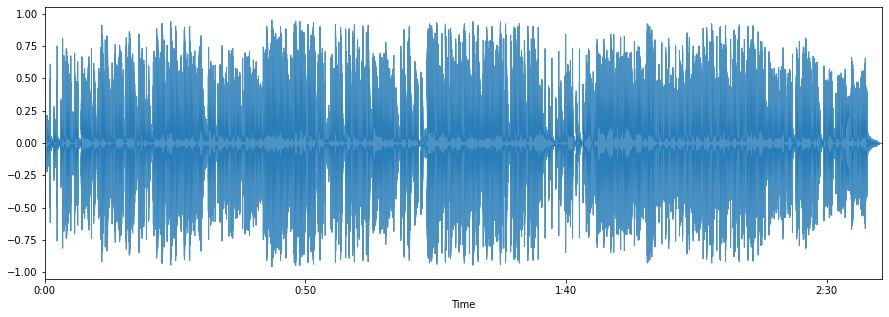

In [10]:
plt.figure(figsize=(15, 5))
librosa.display.waveplot(samples, sample_rate, alpha=0.8)

## 1. Vibrations and Sinusoids
The production of sound by variations in air pressure. When the paper cone of a stereo speaker pushes out, it compresses the air (increasing the density of the molecules)

<img src='./img/FMP_C1_F19.png'>

#### 1.1. Pressure Waves

- Amplitude : the peak deviation of the sinusoid from its mean
- Frequency : the number of compressed or rarefied patches of air per second.
- Phase : determining where in its cycle the sinusoid is at time zero

#### 1.2. Sinusoid
A sound wave can be visually represented by a waveform. If the points of high and low air pressure repeat in an alternating and regular fashion, the resulting waveform is called periodic. 

In this case, the period of the wave is defined as the time required to complete a cycle. The frequency, measured in Hertz (Hz), is the reciprocal of the period. The simplest type of periodic waveform is a sinusoid, which is completely specified by its frequency, its amplitude (the peak deviation of the sinusoid from its mean), and its phase (determining where in its cycle the sinusoid is at time zero). 

#### 1.3. Complex sinusoid

$$x[n] = A\exp{j(\omega nT+\varphi)} = A\cos(\omega nT+\varphi) + jA\sin(\omega nT+\varphi) (2)$$
where, $x$ is the array of complex values of the sinusoid, n is an integer value expressing the time index, $A$ is the amplitude value of the sinusoid, $\exp$ is the complex exponential number, $\omega$ is the frequency of the sinusoid in radians per second (equal to $2\pi f$), $T$ is the sampling period equal 1=fs, fs is the sampling
frequency in Hz and $\varphi$ is the initial phase of the sinusoid in radians.

In [11]:
A = 0.9
f = 440
phi = np.pi/2
fs = 22050
t = 5

In [12]:
def Sinusoid(A,f,phi,fs,t):
    t = np.arange(0,t,1.0/fs)
    x = A * np.cos(2*np.pi*f*t+phi)
    return x

In [19]:
sin = Sinusoid(A,f,phi,fs,t)
ipd.Audio(sin, rate=fs)

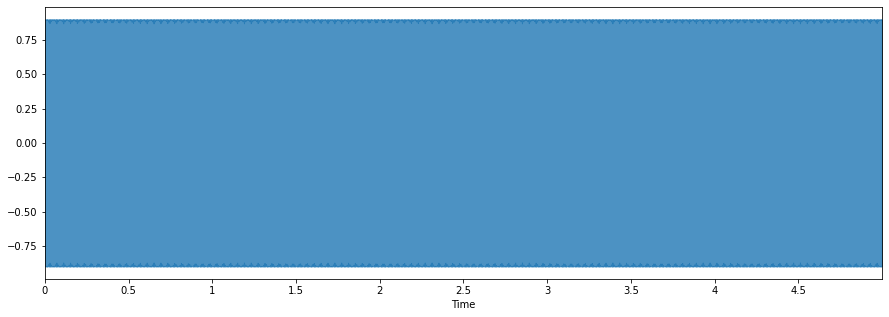

In [22]:
plt.figure(figsize=(15, 5))
librosa.display.waveplot(sin, fs, alpha=0.8)

we generate a chirp signal which frequency increases by a factor of two (one octave) every second. Starting with  80 Hz , the frequency raises to over a total duration of  5  seconds.

In [8]:
def generate_chirp_exp_octave(Fs, duration, freq_start):
    N = int(duration * Fs)
    t = np.arange(N) / Fs
    chirp = np.sin(2 * np.pi * freq_start * np.power(2, t / duration) * duration)
    return chirp

In [9]:
Fs = 44100
duration = 1
freq_start = 80 * 2**np.arange(5)
for f in freq_start:
    if f==freq_start[0]:
        chirp = generate_chirp_exp_octave(Fs=Fs, duration=duration, freq_start=f)
    else:
        chirp_oct = generate_chirp_exp_octave(Fs=Fs, duration=duration, freq_start=f)
        chirp = np.concatenate((chirp,chirp_oct))

ipd.display(ipd.Audio(chirp, rate=Fs))

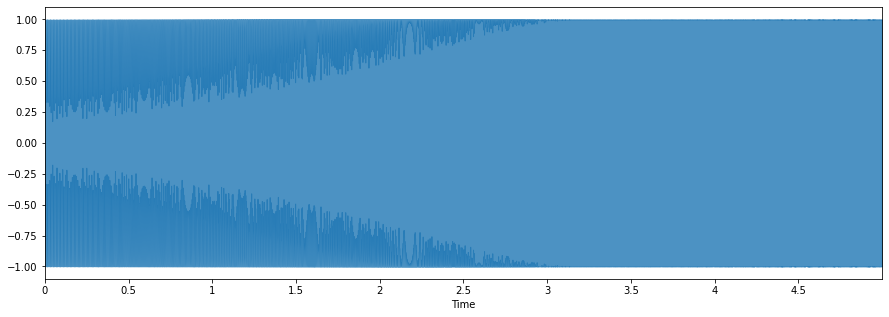

In [21]:
plt.figure(figsize=(15, 5))
librosa.display.waveplot(chirp, Fs, alpha=0.8)

### Fourier transform

Explaining the Fourier transform intuitively, the Fourier transform is an expression that decomposes an arbitrary input signal into the sum of periodic functions (plural exponential functions) having various frequencies. And the process of finding the amplitude of each periodic function is called Fourier transform.

<img src='./img/period.svg' width=70%>

-Period: The time it takes for a wave to vibrate once, or its length, usually the sin function period is $2\pi /w$
-Frequency: The number of vibrations in one second.

Let's look at the equation of the Fourier transform.

$$
y(t)=\sum_{k=-\infty}^\infty A_k \, \exp \left( i\cdot 2\pi\frac{k}{T} t \right)
$$

Let's interpret this expression as one expression. $k$ moves in the range of $-\infty ~ \infty$. This is the number of periodic functions. A signal is expressed as the sum of other periodic functions, which are in infinite range.

Then $ A_k $ is the amplitude of the sine function. In this equation, the input signal $ y_ {t} $ for time is a linear combination of  $\exp \left( i\cdot 2\pi\frac{k}{T} t \right)$ and amplitude ($ A_k $). You are saying it is expressed.



The formula for amplitude is:

$$
A_k = \frac{1}{T} \int_{-\frac{T}{2}}^\frac{T}{2} f(t) \, \exp \left( -i\cdot 2\pi \frac{k}{T} t \right) \, dt
$$

I think you have a question here. It is said to be expressed as the sum of the periodic functions, because we are looking at$\exp \left( i\cdot 2\pi\frac{k}{T} t \right)$ in the form of an exponential function.

What is the relationship between exponential and periodic functions? It was the Euler formula that found the relationship.

$$
e^{i\theta} = \cos{\theta} + i\sin{\theta}
$$

If you express this expression like the above,
$$
\exp \left( i\cdot 2\pi\frac{k}{T} t \right) = \cos\left({2\pi\frac{k}{T}}\right) + i\sin\left({2\pi\frac{k}{T}}\right)
$$

Here, the functions $\cos{2\pi\frac{k}{T}}$, $i\sin{2\pi\frac{k}{T}}$ are periodic functions with period and frequency.

That is, the Fourier transform is always decomposable with the sum of periodic functions such as sin and cos, regardless of what the input singal is.

### DFT (Discrete Fourier Transform)

I have a question. That's because the data we came into sampling is discrete data of the amplitude of the sound over time. If so, consider the above Fourier transform expression as a discrete domain.

If the data we collect is $ y_ {n} $, and the discrete time series data repeats with a period of $ N $, the DFT can be expressed as the sum of $ N $ sine functions with different frequencies and amplitudes.

$$
y_n = \frac{1}{N} \sum_{k=0}^{N-1} Y_k \cdot \exp \left( i\cdot 2\pi\frac{k}{N} n \right)
$$

Looking at the above equation, it can be seen that the range of k has changed from 0 to $ N-1 $. The Spectrum $ Y_ {k} $ is called the Fourier transform of the original time series data.

$$
Y_k = \sum_{n=0}^{N-1} y_n\cdot \exp \left( -i\cdot 2\pi\frac{k}{N} n \right)
$$

-$ y_ {n} $: input signal
-$ n $: Discrete time index
-$ k $: discrete frequency index
-$ Y_ {k} $: Spectrum value for the kth frequeny

In [10]:
def DFT(x):
    N = len(x)
    X = np.array([])
    nv = np.arange(N)
    
    for k in range(N):
        s = np.exp(1j*2*np.pi*k/N*nv)
        X = np.append(X, sum(x*np.conjugate(s)))
    return X

### STFT (Short-Time Fourier Transform)

FFT does not know when the frequency of the signal changes over time, and at what time the frequency changes. To overcome this limitation, STFT divides the length of time and now performs a Fourier transform. In other words, when you do an FFT, information about Time domina will be blown away.

This is a method of analyzing sounds whose frequency characteristics change over time. It is generally suitable for the signal data we use. This is data that divides time series data into a certain time interval (window size) and obtains a spectrum for each interval. This is expressed as time-frequency two-dimensional data.

$$
X(l,k) = \sum_{n=0}^{N-1} w(n) x(n+lH)\exp^{\frac{-2\pi k n}{N}}
$$

- $N$: FFT size
    - How many frequency bands the window is divided into.
    

- Duration
    - Sampling rate divided by window.
    - $ T = window / SR $
    - T (Window) = 5T (Signal), duration should be longer than 5 times longer than signal period.
    - The window size of 440Hz signal is 5 * (1/440).

- $w(n)$: Window function 
    - Hann window is generally used.

- $n$: Window size
    - This is the amount of sample that enters the Window function.
    - The smaller it has, the lower the frequency resolution and the higher the time resolution.
    - The longer it has, the higher the frequency and the lower time resolution.
    
- $H$: Hop size
    - The size of overlapping windows. Normally, about 1/4 of them are overlapped.

The result of STFT, that is, the amplitude of each frequency domain according to the flow of time (Window) is returned.

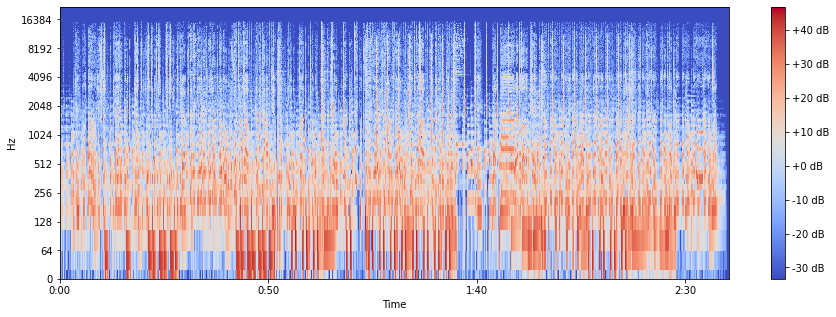

In [11]:
# STFT
X = librosa.core.stft(samples, n_fft=1024, hop_length=512, win_length=1024)
S = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15, 5))
librosa.display.specshow(S, sr=sample_rate, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')